# Remixing Writing Pedagogies with Writing Code and Data through Exploratory Data Analysis

**CCCC 2025 | Computer Love | Session 2151 | Room 350**

- **Time**: 04/10/2025 4:45PM - 6:00PM EDT   
-  **Abstract**: What is our discipline’s role in teaching and advocating for critical approaches to writing data? The facilitator and attendees will work through a computational notebook together that conducts exploratory data analysis. This coding and data process is meant to facilitate discussion to learn more about what writing and technical communication can bring to data practices.<br><br>
  The goal will be to learn more about the problems and potential for writing and technical and professional communication (TPC) scholars and teachers to teach coding and data practices, such as machine learning and data modeling, with a humanities-driven, advocacy approach.
- Who Should Come?: Novices and experts are all welcome and encouraged to attend. No previous experience coding is required, since this ELE is meant to facilitate a discussion about the role that writing and TPC plays pedagogically beyond using (or not using) generative AI tools.
- Accompanying [Google Slides](https://docs.google.com/presentation/d/12-__kN5FD6JKRd7bovFplPfexBmnuCj9/edit?usp=sharing&ouid=106375923921921850595&rtpof=true&sd=true)
- License: CC BY-NC-SA
- [![DOI](https://zenodo.org/badge/962807649.svg)](https://doi.org/10.5281/zenodo.15177209)

## Citation

- Lindgren, C. A. (10 Apr. 2025). Remixing Writing Pedagogies with Writing Code and Data through Exploratory Data Analysis. NCTE CCCC 2025. Baltimore, MD, United States. https://doi.org/10.5281/zenodo.15177209


# Chapter 4. Text Classification with Logistic Regression

Our first machine-learning challenge is to create a prediction model that categorizes news articles with the appropriate categories from a set of 31 categories: politics, entertainment, etc. The model uses logistic regression techniques in Python on a dataset with headlines, short descriptions, and URLs. 

*NOTE*: Be sure to watch and read the materials posted in the Canvas module before and while you work through this notebook.

**Learning Objectives**

1. Import and run EDA techniques to understand the potential limits and affordances of the dataset with our ML goal in mind.
2. Learn about the basic mechanics of logistic regression (LR).
3. Apply LR to this text classification goal of categorizing the news genre of articles based on potential "features" in the data, such as the article's headline, short description, and URL.

**Sources**

- Notebook modified from Ganesan's LR example exercise: [Text Classification with Logistic Regression](https://github.com/kavgan/nlp-in-practice/tree/master/text-classification)
- Dataset: **HuffPost News Headlines &amp; Categories** in [../data/news_category_dataset.json](../data/news_category_dataset.json)

## Import Libraries

In [1]:
# You may need to install some of the libraries below
# If so, uncomment any of the below commands
# %pip install pandas==2.1.4
# %pip install matplotlib==3.10.0
# %pip install scipy==1.13.1
# %pip install seaborn==0.12.2
# %pip install wquantiles==0.6
# %pip install statsmodels==0.14.4
# %pip install scikit-learn==1.6.0
# %pip install mplcyberpunk==0.7.6

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
import logging
# Custom utility functions
from utils import _reciprocal_rank,compute_accuracy,compute_mrr_at_k,collect_preds,extract_features,get_top_k_predictions,train_model,roc_curve_per_category,plot_class_roc_curve

%config InlineBackend.figure_formats = ['svg']
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

## 0. Refresher on pandas' dataframes

We can use the pandas library to read in, review, and revise the data set.

`pandas`, i.e., **Panel data** or **Dataframe**, organizes information in rows for *What is observed** and columns for *properties of those observations*, as well as an *index* column to make it easier to reference each row uniquely.

<figure style="float:left;margin:0 1rem 0 0;width:300px">
<img style="border:solid black 1px;border-radius:7px;" src="./images/3.1-pandas-data-structure.png">
<figcaption style="font-size:8px">Original image src: <a href="https://github.com/dataprofessor/streamlit-for-datascience/tree/master/img">Nantasenamat</a></figcaption>
</figure>
Pandas makes it so much easier to work with indexed tabular data. The main types of data structures that pandas work with are *Series* and *DataFrames*.

**Pandas Series**: One-dimensional array akin to a `column` *OR* a `row` in a spreadsheet. They are essentially a special kind of array list with special methods and functions. 

**Pandas DataFrame**: Two-dimensional array akin to the combination of `columns` *AND* `rows` in a spreadsheet. Like Series, the DataFrame has special methods and functions that we can use to explore and analyze data. Also, we will focus a lot more on DFs, rather than Series. But, you should know about Series, because you sometimes create new Series (columns or rows) to add to your existing DataFrame. It's pretty rad.

**Indices**: Notice the color-coding going in the figure: red, blue, and yellow. The red and blue represent the indices of the rows and columns, while the yellow squares represent the values in the dataset.

Recall how pandas' "panel data" helps us more easily transform multiple types of structured data into what's called a *DataFrame*. Dataframe's are two-dimensional tabular data that are mutable (transformable) with labeled axes (rows and columns). See chapter 3 to refresh your memory, if needed. You can also reference [pandas in general](https://pandas.pydata.org/docs/getting_started/index.html#getting-started), or its [Dataframe datatype](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html#pandas.DataFrame).

## 1. Import the Data

In [3]:
 
# Imports the noted JSON file as a pandas DataFrame based on the path below
df = pd.read_json("./data/news_category_dataset.json", lines=True)

## 2. Exploratory Data Analysis

`.shape` returns a `tuple` e.g., `(value, value)`, with info about the basic 2 dimensions of panel data:
1. the number of rows, and
2. the number of columns.

In [4]:
df.shape

(124989, 6)

The pandas DataFrame `.info()` method returns a more comprehensive description of the data set.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124989 entries, 0 to 124988
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   short_description  124989 non-null  object        
 1   headline           124989 non-null  object        
 2   date               124989 non-null  datetime64[ns]
 3   link               124989 non-null  object        
 4   authors            124989 non-null  object        
 5   category           124989 non-null  object        
dtypes: datetime64[ns](1), object(5)
memory usage: 5.7+ MB


Looks like there are no `null` values in the dataset.

Let's dig deeper into the columns and values.

### 2.1 Review particular columns

Be sure to review the data per column. The goals of this modeling may be set for you, but you will be asked to perform similar EDA work on your final project, so you can better understand the modeling possibilities and boundaries with your data. So, the below includes a series of exercises for you to understand this dataset before you conduct the actual modeling work.

In [6]:
# List the columns for reference
df.columns

Index(['short_description', 'headline', 'date', 'link', 'authors', 'category'], dtype='object')

### 2.2 Describe and examine the `headline` column

We can use `.describe()` on a Series, so we can consider any potential quirks. 

Let's check out the `headline` column, since that's an important column for training our model.

##### What are the summary stats for the `headline`?

In [7]:
df.headline.describe()

count             124989
unique            124560
top       Sunday Roundup
freq                  90
Name: headline, dtype: object

Some initial observations: 

- Noticing how there is a decently sized difference between the `count` and `unique` values
- `top`: How "Sunday Roundup" headline appears 90 times (`freq`) in the `headline` column (`Name: headline, dtype: object`).

Let's review rows with the "Sunday Roundup" value in the headline column by using our new skills with pandas. Below I ...

1. `df.loc[]`: query the dataframe with the location method
2. `[df.headline]`: Specifiy what slice of the data I want to isolate.
3. `.str.contains('Sunday Roundup')`: Since `headline` values are Strings, and I want to isolate any rows with the "Sunday Roundup" headline, search the isolated Series, `headline`,  with the `.str.contains()` method. It takes a string as its main parameter.

In [8]:
df.loc[df.headline.str.contains('Sunday Roundup')].sample(10)

,short_description,headline,date,link,authors,category
64821,"This week, if you thought the floor had been r...",Sunday Roundup,2016-03-06,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
97993,"Tonight, after an interminable build-up, we fi...",Sunday Roundup,2015-02-22,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
122492,"This week, Karl Rove suggested that Hillary Cl...",Sunday Roundup,2014-05-18,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
120664,With Friday's numbers showing the addition of ...,Sunday Roundup,2014-06-08,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
108341,"This week, Ebola arrived in New York City -- A...",Sunday Roundup,2014-10-26,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
79103,"This week, the nation was transfixed by the ra...",Sunday Roundup,2015-09-27,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
58142,This week the nation watched as the #NeverTrum...,Sunday Roundup,2016-05-22,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
80353,"This week, summer vacation ended for millions ...",Sunday Roundup,2015-09-13,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
101031,"This week, the Oscar race heated up, with Bird...",Sunday Roundup,2015-01-18,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS
61198,"This week, the nation watched Kobe Bryant say ...",Sunday Roundup,2016-04-17,https://www.huffingtonpost.com/entry/sunday-ro...,"Arianna Huffington, Contributor",POLITICS


Let's review the top 5 repeating headlines, in case there's somethign worth noting.

<Axes: ylabel='headline'>

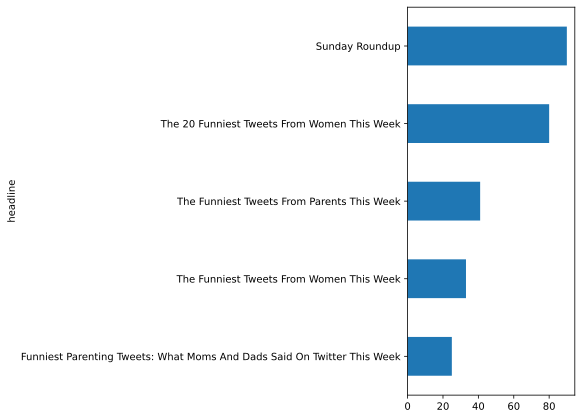

In [9]:
df.groupby(['headline'])['headline'].count().sort_values(ascending=True)[-5:].plot(
  kind='barh',
  figsize=(3,7)
)

### 2.3 How long are the headlines? (What's the distribution?)

Also curious about the distribution of the length of those headlines, because that can tell us how much semantic info may be available in the headlines. Specifically, **if a large sum of headlines are only 3-4 words, that may put a cap on how much contextual info each categorical label will actually supply the LR model**.

So, let's add a new column to the pandas DataFrame, `df`, by `apply()`ing the `len` (length) method to the `headline` column. Below, I do so with the `apply()` method and assign the values per row to a new Series (column) that I call `headline_length`.

In [10]:
df['headline_char_length'] = df.headline.apply(len)
df.head()

,short_description,headline,date,link,authors,category,headline_char_length
0,She left her husband. He killed their children...,There Were 2 Mass Shootings In Texas Last Week...,2018-05-26,https://www.huffingtonpost.com/entry/texas-ama...,Melissa Jeltsen,CRIME,64
1,Of course it has a song.,Will Smith Joins Diplo And Nicky Jam For The 2...,2018-05-26,https://www.huffingtonpost.com/entry/will-smit...,Andy McDonald,ENTERTAINMENT,75
2,The actor and his longtime girlfriend Anna Ebe...,Hugh Grant Marries For The First Time At Age 57,2018-05-26,https://www.huffingtonpost.com/entry/hugh-gran...,Ron Dicker,ENTERTAINMENT,47
3,The actor gives Dems an ass-kicking for not fi...,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,2018-05-26,https://www.huffingtonpost.com/entry/jim-carre...,Ron Dicker,ENTERTAINMENT,69
4,"The ""Dietland"" actress said using the bags is ...",Julianna Margulies Uses Donald Trump Poop Bags...,2018-05-26,https://www.huffingtonpost.com/entry/julianna-...,Ron Dicker,ENTERTAINMENT,71


Ok, we counted characters in the headline to capture one angle of headline length. Now, let's add an approximate word length Series as a column in the DataFrame.

Use `apply()`, again, but use a little Python built-in method magic to create a simple function that:
1. Assigns a variable to the row's headline String value: `lambda hl:`
2. Splits the `hl` String value into a List array delimited by spaces: `hl.split(' ')`
3. Returns the length of the List array as an Integer: `len()`

BOOM! We got a great approximation of the number of words in a new column.

In [11]:
df['headline_word_length'] = df.headline.apply(lambda hl: len(hl.split(' ')) )
df.head()

,short_description,headline,date,link,authors,category,headline_char_length,headline_word_length
0,She left her husband. He killed their children...,There Were 2 Mass Shootings In Texas Last Week...,2018-05-26,https://www.huffingtonpost.com/entry/texas-ama...,Melissa Jeltsen,CRIME,64,14
1,Of course it has a song.,Will Smith Joins Diplo And Nicky Jam For The 2...,2018-05-26,https://www.huffingtonpost.com/entry/will-smit...,Andy McDonald,ENTERTAINMENT,75,14
2,The actor and his longtime girlfriend Anna Ebe...,Hugh Grant Marries For The First Time At Age 57,2018-05-26,https://www.huffingtonpost.com/entry/hugh-gran...,Ron Dicker,ENTERTAINMENT,47,10
3,The actor gives Dems an ass-kicking for not fi...,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,2018-05-26,https://www.huffingtonpost.com/entry/jim-carre...,Ron Dicker,ENTERTAINMENT,69,11
4,"The ""Dietland"" actress said using the bags is ...",Julianna Margulies Uses Donald Trump Poop Bags...,2018-05-26,https://www.huffingtonpost.com/entry/julianna-...,Ron Dicker,ENTERTAINMENT,71,13


<Axes: >

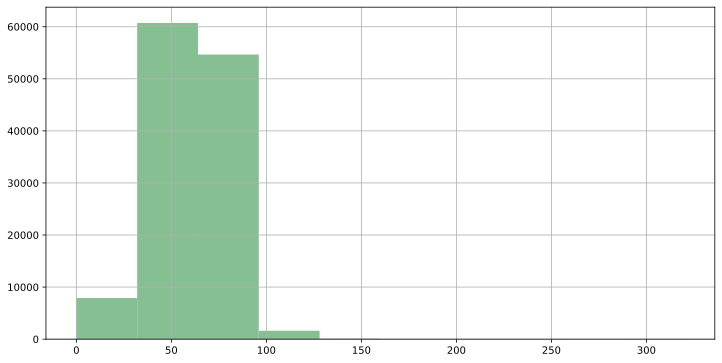

In [12]:
'''
  .hist() -- Creates a histogram chart with a dataframe's Series 
  Histograms place a metric in bins -- dates in this case -- to understand the distribution of the data. In this case, the distribution of the data over time
'''
df.headline_char_length.hist(
  figsize=(12,6),
  color='#86bf91',
)

Looks like there's some variance with some headlines that are over 100 characters long and as much as ~300.

Let's use `.describe()` on this new column as a table of values to review.

<Axes: >

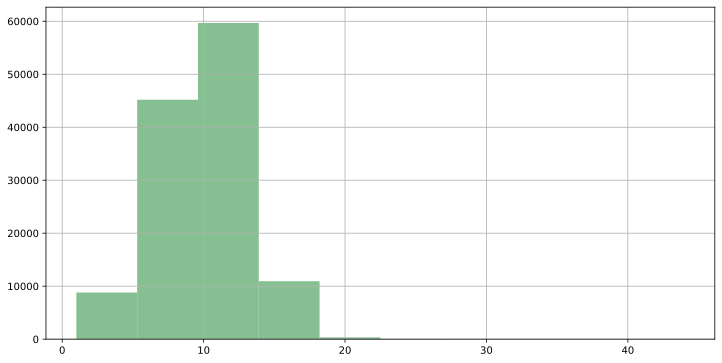

In [13]:
'''
  .hist() -- Creates a histogram chart with a dataframe's Series 
  Histograms place a metric in bins -- dates in this case -- to understand the distribution of the data. In this case, the distribution of the data over time
'''
df.headline_word_length.hist(
  figsize=(12,6),
  color='#86bf91',
)

In [14]:
df.headline_char_length.describe()

count    124989.000000
mean         60.023194
std          17.274685
min           0.000000
25%          49.000000
50%          62.000000
75%          71.000000
max         320.000000
Name: headline_char_length, dtype: float64

In [15]:
df.headline_word_length.describe()

count    124989.000000
mean          9.863868
std           2.886560
min           1.000000
25%           8.000000
50%          10.000000
75%          12.000000
max          44.000000
Name: headline_word_length, dtype: float64

### 2.4 Exercise -- Observations about the headlines column

- ***ENTER YOUR FIRST OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER YOUR SECOND OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER MORE OBSERVATIONS***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***

### 2.5 What are the range and distribution of dates?

Since we have a `date` column, and the datatype is in a standardized format, we can quickly plot the date range in a histogram figure.

Let's jot down some observations in our notebook.

**NOTE**: Be sure to respond to the questions and add at least one more potential question, observation, and potential explanation for it

### 2.6 *EXERCISE* -- Notes on the distribution of the data based on the `date` column

<Axes: >

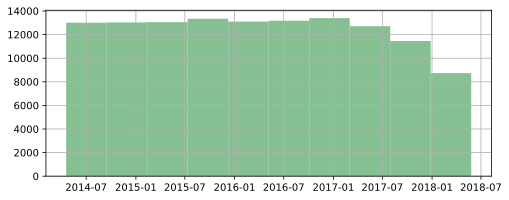

In [16]:
'''
  .hist() -- Creates a histogram chart with a dataframe's Series 
  Histograms place a metric in bins -- dates in this case -- to understand the distribution of the data. In this case, the distribution of the data over time
'''
df.date.hist(
  figsize=(8,3),
  color='#86bf91',
)

- Articles' publishing dates range between July 2014 and July 2018
  - Question: How might this impact the model's output?
  - ***YOUR RESPONSE HERE***
- Fewer 2018 articles compared to the rest of the dataset.
  - Question: How might this impact the model's output?
  - ***YOUR RESPONSE HERE***

### 2.7 Describe and examine the `category` column of news genres in the data

Use *dot notation* and a *column name* with `sample()` to sample values in that column (Series).

**Remember**: The dataframe stays the same because we are not altering `df`.

In [17]:
df.category.sample(5)

120647             ARTS
37768      BLACK VOICES
67675            COMEDY
54682     ENTERTAINMENT
51053      BLACK VOICES
Name: category, dtype: object

Now, let's read and understand the news genre categories (politics, entertainment, etc.) in the dataset, as well as their distribution.

We can use the `len()` and `set()` functions in Python to isolate the unique number of values in a column. 

`len()` by itself would provide a length of *all values combined*, even if the value is repeated. By using `set()` first on the column, we can tell Python to reduce the column to unique set of values. Then, it will count that unique set with `len()`.

In [18]:
len(
  set(df['category'].values)
)

31

In [19]:
set(
  df['category'].values
)

{'ARTS',
 'ARTS & CULTURE',
 'BLACK VOICES',
 'BUSINESS',
 'COLLEGE',
 'COMEDY',
 'CRIME',
 'EDUCATION',
 'ENTERTAINMENT',
 'FIFTY',
 'GOOD NEWS',
 'GREEN',
 'HEALTHY LIVING',
 'IMPACT',
 'LATINO VOICES',
 'MEDIA',
 'PARENTS',
 'POLITICS',
 'QUEER VOICES',
 'RELIGION',
 'SCIENCE',
 'SPORTS',
 'STYLE',
 'TASTE',
 'TECH',
 'THE WORLDPOST',
 'TRAVEL',
 'WEIRD NEWS',
 'WOMEN',
 'WORLD NEWS',
 'WORLDPOST'}

### 2.8 `category` by count

Let's review the distribution of categories, since this could impact the model.

In the code below, we tell Python to:

1. Select the `category` column,
2. Count the values of each value in the column with `value_counts()`,
3. Plot the results with `plot` and provide the value `bar` for its parameter `kind`

##### 2.2.3.3 *EXERCISE* -- Notes on the distribution of the data based on the `category` column

- ***ENTER YOUR FIRST OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER YOUR SECOND OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER MORE OBSERVATIONS***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***

<Axes: ylabel='category'>

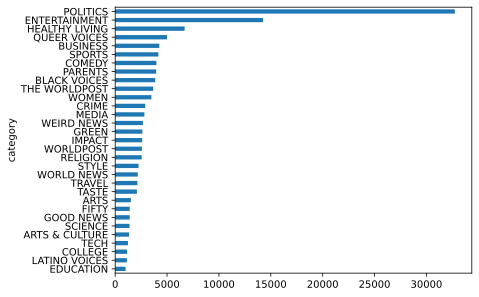

In [20]:
df['category'].value_counts().sort_values(ascending=True).plot(
  kind='barh'
)

### 2.9 Describe and examine the `short_description` column

In [21]:
df.short_description.describe()

count     124989
unique    103905
top             
freq       19590
Name: short_description, dtype: object

In [22]:
df['sd_char_length'] = df.short_description.apply(len)
df[['short_description','sd_char_length']].sample(5)

,short_description,sd_char_length
24247,You would be much better off if you got Trump ...,115
86055,The story behind a hashtag that helped transfo...,85
60795,This is one of the largest bankruptcies involv...,74
72002,Tim Roth reveals a secret Tarantino connection.,47
5098,"They're both ""so easy to buy,"" she said.",40


In [23]:
df['sd_word_length'] = df.short_description.apply(lambda sd: len(sd.split(' ')) )
df.head()

,short_description,headline,date,link,authors,category,headline_char_length,headline_word_length,sd_char_length,sd_word_length
0,She left her husband. He killed their children...,There Were 2 Mass Shootings In Texas Last Week...,2018-05-26,https://www.huffingtonpost.com/entry/texas-ama...,Melissa Jeltsen,CRIME,64,14,76,13
1,Of course it has a song.,Will Smith Joins Diplo And Nicky Jam For The 2...,2018-05-26,https://www.huffingtonpost.com/entry/will-smit...,Andy McDonald,ENTERTAINMENT,75,14,24,6
2,The actor and his longtime girlfriend Anna Ebe...,Hugh Grant Marries For The First Time At Age 57,2018-05-26,https://www.huffingtonpost.com/entry/hugh-gran...,Ron Dicker,ENTERTAINMENT,47,10,87,15
3,The actor gives Dems an ass-kicking for not fi...,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,2018-05-26,https://www.huffingtonpost.com/entry/jim-carre...,Ron Dicker,ENTERTAINMENT,69,11,86,14
4,"The ""Dietland"" actress said using the bags is ...",Julianna Margulies Uses Donald Trump Poop Bags...,2018-05-26,https://www.huffingtonpost.com/entry/julianna-...,Ron Dicker,ENTERTAINMENT,71,13,87,13


In [24]:
# Print out a short comparison report
print(
  '# Short Desc CHAR Length',
  '\n', df.sd_char_length.describe(),
  '\n\n# Short Desc WORD Length',
  '\n', df.sd_word_length.describe(),
)

# Short Desc CHAR Length 
 count    124989.000000
mean         92.415373
std          84.832972
min           0.000000
25%          33.000000
50%          76.000000
75%         123.000000
max        1472.000000
Name: sd_char_length, dtype: float64 

# Short Desc WORD Length 
 count    124989.000000
mean         15.935050
std          14.447419
min           1.000000
25%           6.000000
50%          13.000000
75%          21.000000
max         243.000000
Name: sd_word_length, dtype: float64


<Axes: >

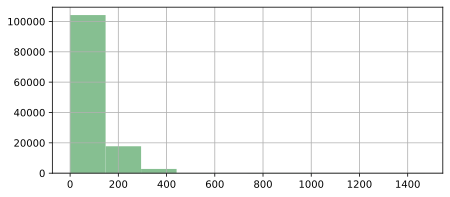

In [25]:
df.sd_char_length.hist(
  figsize=(7,3),
  color='#86bf91',
)

<Axes: >

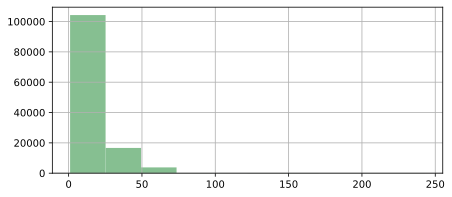

In [26]:
df.sd_word_length.hist(
  figsize=(7,3),
  color='#86bf91',
)

In [27]:
# Scatter plot using pandas
ax = df.plot(
  kind='scatter',
  x='sd_word_length',
  y='sd_char_length',
  color='red',
  title='Relationship between word and character length of SDs'
)

# Customizing plot elements
ax.set_xlabel("SD Word Length")
ax.set_ylabel("SD Char Length")

plt.show()

### 2.10 *EXERCISE* -- Notes on the `sd_length` column

- ***ENTER YOUR FIRST OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER YOUR SECOND OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER MORE OBSERVATIONS***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***

## 3. Process the Data for Classification

Some of the fields will be useful to use for the classification task.

1. `headline`: Since we're writing a model to classify headlines, this column is integral to our goal.
2. `short_description`: This column includes a short descrtiption of the story, which will provide potentially helpful contextual information to make a better model for our genre classifier. We'll see!
3. `tokenized_url`: This column includes information too! Different parts of URLs often capture how people have organized and classified information. So, the URL may also provide potentially helpful contextual information to make a better model. Again, we'll see!

The code below creates 3 new columns for that task.

There's a lot to unpack below, but it basically

1. normalizes the URL for each article via the `tokenize_url()` function, which strips the URL down to the portion where the URL conveys article-specific information. Then, 
2. it creates 3 new columns that are combined with the available data.

In [28]:
def tokenize_url(url:str):
    url=url.replace("https://www.huffingtonpost.com/entry/","")
    url=re.sub("(\W|_)+"," ",url)
    return url

df['tokenized_url']=df['link'].apply(lambda x:tokenize_url(x))

#just the description
df['text_desc'] = df['short_description']

#description + headline
df['text_desc_headline'] = df['short_description'] + ' '+ df['headline']

#description + headline + tokenized url
df['text_desc_headline_url'] = df['short_description'] + ' '+ df['headline']+" " + df['tokenized_url']

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124989 entries, 0 to 124988
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   short_description       124989 non-null  object        
 1   headline                124989 non-null  object        
 2   date                    124989 non-null  datetime64[ns]
 3   link                    124989 non-null  object        
 4   authors                 124989 non-null  object        
 5   category                124989 non-null  object        
 6   headline_char_length    124989 non-null  int64         
 7   headline_word_length    124989 non-null  int64         
 8   sd_char_length          124989 non-null  int64         
 9   sd_word_length          124989 non-null  int64         
 10  tokenized_url           124989 non-null  object        
 11  text_desc               124989 non-null  object        
 12  text_desc_headline      124989

### 3.1 EXERCISE -- Notes on the on the `text_desc_headline_url` column

Let's sample the new row with the URL info to see what it includes.

In [29]:
# Randomly .sample() some of the text_desc_headline_url column
# Execute multiple times to get different random sample (n)
df['text_desc_headline_url'].sample(5).values.tolist()

['“I f**king killed my sister, OK? I know I’m going to jail for life," she said in footage after the suspected DUI crash. Teen Driver Accused Of Livestreaming Crash That Killed Younger Sister instagram livestream deadly crash us 5975e20ae4b0e79ec19a9269',
 "Late spring 1993, a widow and her three children became homeless. Tyeast Boatwright had managed to get by after her husband's death. She'd had a good job coding pediatric medical records for the University of Chicago, but administrative cuts eliminated her position. Heroes for Homeless Kids Celebrate in Aurora heroes for homeless children b 5288723 html",
 "To truly understand the meaning of America, ask someone who wasn't born here. In my case, that's easy. The Meaning of America? Ask My Family the meaning of america as b 10803362 html",
 ' Shelter Dogs Now Helping Save Lives In Nepal Following Earthquake search and rescue dogs nepal n 7173958 html',
 "Aaron and Austin Rhodes say  the viral 2015 clip was life-changing. YouTube's Rh

- ***ENTER YOUR OBSERVATION HERE***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***
- ***ENTER MORE OBSERVATIONS***
  - Question: How might this impact our model's output?
  - ***YOUR RESPONSE HERE***

## 4. Train a Logistic Regression Model

### 4.1 What's a Logistic Regression Model?

Logistic regression returns a probability that something may or may not happen or "be". We can use this probability as a single value to assess the likelihood of the event/being, such as "This X headline is of Y news genre".

<div style="height:50px;break:both"></div>

<figure style="float:left;margin:0 1.5rem 0 0;max-width:550px">
<img style="border:solid black 1px;border-radius:7px;" src="./images/slides/LR-example-politics-high.png">
<figcaption style="font-size:8px">Original image src: Lindgren</figcaption>
</figure>

<style>
  .fig_list__container {
    
    & span {
      font-size: 1.1em !important;
      font-weight: bold !important;
    }

    & ul {
      margin-left: 2em;
      & li {
        margin-bottom: 1em !important;
      }
    }
  }
</style>
<div class="fig_list__container">
<ul>
  <li><span>Binary Classification Thresholds</span>: <br/>Uses binary (dichotomous or discrete) data to predict probability of  binary decision: Yes or No? Typically, this is called a *classification threshold*.
  <li><span>“Predictors”</span>: <br/>1 or more independent variables: features, i.e., words from a corpus of headlines
  <li><span>“Criterion”</span>: <br/>Variables used to determine a binary decision about the output (dependent variable (news genre of article)
  <li><span>Computation Method</span>: <br/>Uses probability, or likelihood, scores to output predictions based on the available features in the input as compared with the trained models features
</ul>
</div>

New genres present us with an interesting case, where inputs may interact with the features scored in the trained model in interesting ways.

<div style="height:50px;break:both"></div>

In this lesson, our LR model uses those probability estimates as a binary category. To do so, we must decide what's called a "classification threshold" or "decision threshold". Any value above that threshold indicates a headline is about POLITICS, and any value below the threshold indicates that the headline is not POLITICS, but some other news genre.

So, let's say our LR model returns a value of 0.990 for a particular headline's news genre as being "POLITICS". This probability score is very likely to accurately predict that this headline is indeed an article about POLITICS. Conversely, another headline with a prediction score of 0.005 on that same logistic regression model is very likely not about POLITICS. Yet, what about a headline with a prediction score of 0.6?

The default decision threshold in the scikit-learn code library that we will use is 0.5. But, this library also enables us to "tune" the LR model based on our problem-dependency / context, as well as take the best/top probability score to predict the news genre of the input headline.

### 4.2 How to Train a Drago... Erm ... a LR Model!

#### 4.2.1 *From Words to Numbers!* - Transform a corpus of words into matrix of integers with `CountVectorizer()`

**Before you review the many functions defined in section 4.2 below**, functions that will automate the modeling process, I want you to understand a very important first step: how we get from word label data to numbers for the model. After all, this is "Writing & Digital Media" **:-)**

So, first things first, we're working with text, so strings and characters. But, a logistic regression model requires numbers. So, we need to extract the features of our corpus and transform them into a data type that can be quantified.

`CountVectorizer()` to the rescue!

To better understand how scikit-learn's built-in functions transform the textual data for us, I provide us with a tiny tiny case of a list of sentences, which transforms our textural data into a **sparse matrix** of values that indicate the frequency of times the word (feature/token) is present in a unit of content (document). 

In this tiny case below, our documents are pretty short strings in a list. Those could be much much bigger, and really it should be for this type of modeling. But, for example purposes, let's see how the matrix logs how many instances a word shows up in each document. 

Each row is the document, (i.e., sentence, in this case), while each column is the feature (word/token). So the values at the intersection of the row and column in the matrix report the raw frequency count (integer).

In [30]:
# Tiny weeny bitty small corpus :-)
# 3 documents (strings) in a list
list_test_text_1 = [
  'Hello my name is chris we are here to do python python python python', 
  'chris this is my python notebook you know python',
  'The python notebook is a chore chris no chris really it is a chore chore chore'
]

# Instantiate an sklearn CountVectorizer (CV) objects
test_cv_object_binary = CountVectorizer(binary=True) #binary values
test_cv_object_counts = CountVectorizer(binary=False) #regular frequency counts
# Instantiate an sklearn TfidfVectorizer objects
test_tfidf_vectorizer_normed = TfidfVectorizer() # normed tfidf scores
test_tfidf_vectorizer = TfidfVectorizer(norm=None, smooth_idf=False) #not normed tfidf scores

# Use the vectorizers' fit_transform() function to conduct the transformation of words into particular quantified values
test_count_matrix_binary = test_cv_object_binary.fit_transform(list_test_text_1)
test_count_matrix_counts = test_cv_object_counts.fit_transform(list_test_text_1)
test_tfidf_matrix_normed = test_tfidf_vectorizer_normed.fit_transform(list_test_text_1)
test_tfidf_matrix = test_tfidf_vectorizer.fit_transform(list_test_text_1)

In [31]:
# Note the specialized data type for sklearn
print(
  'Binary Data Type:',type(test_count_matrix_binary),
  '\nCounts Data Type::',type(test_count_matrix_counts),
  '\nTFIDF Data Type:',type(test_tfidf_matrix),
)

Binary Data Type: <class 'scipy.sparse._csr.csr_matrix'> 
Counts Data Type:: <class 'scipy.sparse._csr.csr_matrix'> 
TFIDF Data Type: <class 'scipy.sparse._csr.csr_matrix'>


If I try to print out the sklearn cv matrix, I'll get some basic data structural info.

In [32]:
print(test_count_matrix_binary.get_shape())

(3, 20)


The matrix has 3 rows (documents/sentences) and 20 columns (unique words/tokens) with values that are dependent on the type of summary: binary, counts, or tfidf.

Let's check out the now transformed/quantified data by converting the returned sparse matrices as a more recognizable data type: a pandas dataframe.

In [33]:
def convert_sparse_matrix_to_df(matrix, vectorized_object):
  # Convert the matrix into a more basic Python array
  count_array = matrix.toarray()

  # Use that array as the data in the DF, then nicely use CV or TFIDF vector object's `get_feature_names_out()` method to provide the column names
  sparse_matrix_as_df = pd.DataFrame(
    data=count_array,
    columns=vectorized_object.get_feature_names_out()
  )

  return sparse_matrix_as_df

In [34]:
# Binary
convert_sparse_matrix_to_df(test_count_matrix_binary, test_cv_object_binary)

,are,chore,chris,do,hello,here,is,it,know,my,name,no,notebook,python,really,the,this,to,we,you
0,1,0,1,1,1,1,1,0,0,1,1,0,0,1,0,0,0,1,1,0
1,0,0,1,0,0,0,1,0,1,1,0,0,1,1,0,0,1,0,0,1
2,0,1,1,0,0,0,1,1,0,0,0,1,1,1,1,1,0,0,0,0


In [35]:
# Counts
convert_sparse_matrix_to_df(test_count_matrix_counts, test_cv_object_counts)

,are,chore,chris,do,hello,here,is,it,know,my,name,no,notebook,python,really,the,this,to,we,you
0,1,0,1,1,1,1,1,0,0,1,1,0,0,4,0,0,0,1,1,0
1,0,0,1,0,0,0,1,0,1,1,0,0,1,2,0,0,1,0,0,1
2,0,4,2,0,0,0,2,1,0,0,0,1,1,1,1,1,0,0,0,0


In [36]:
# Not Normed TF-IDF
convert_sparse_matrix_to_df(test_tfidf_matrix, test_tfidf_vectorizer)

,are,chore,chris,do,hello,here,is,it,know,my,name,no,notebook,python,really,the,this,to,we,you
0,2.098612,0.000000,1.0,2.098612,2.098612,2.098612,1.0,0.000000,0.000000,1.405465,2.098612,0.000000,0.000000,4.0,0.000000,0.000000,0.000000,2.098612,2.098612,0.000000
1,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.0,0.000000,2.098612,1.405465,0.000000,0.000000,1.405465,2.0,0.000000,0.000000,2.098612,0.000000,0.000000,2.098612
2,0.000000,8.394449,2.0,0.000000,0.000000,0.000000,2.0,2.098612,0.000000,0.000000,0.000000,2.098612,1.405465,1.0,2.098612,2.098612,0.000000,0.000000,0.000000,0.000000


In [37]:
# Normed TF-IDF
convert_sparse_matrix_to_df(test_tfidf_matrix_normed, test_tfidf_vectorizer_normed)

,are,chore,chris,do,hello,here,is,it,know,my,name,no,notebook,python,really,the,this,to,we,you
0,0.268634,0.000000,0.158660,0.268634,0.268634,0.268634,0.158660,0.000000,0.000000,0.204303,0.268634,0.000000,0.000000,0.634638,0.000000,0.000000,0.000000,0.268634,0.268634,0.000000
1,0.000000,0.000000,0.236251,0.000000,0.000000,0.000000,0.236251,0.000000,0.400008,0.304216,0.000000,0.000000,0.304216,0.472502,0.000000,0.000000,0.400008,0.000000,0.000000,0.400008
2,0.000000,0.821339,0.242548,0.000000,0.000000,0.000000,0.242548,0.205335,0.000000,0.000000,0.000000,0.205335,0.156162,0.121274,0.205335,0.205335,0.000000,0.000000,0.000000,0.000000


**What do we notice?**

All dataframe/matrices include:

- 3 rows == number of documents
- 20 columns == Set number of terms/tokens
- **Binary** values are either 0 or 1 
- **Counts** values are the *frequency* of times a word shows up in a document
- **TFIDF** values are a type of *weighted average* score per word in a document

##### So what is TFIDF, again?

TF-IDF measures how important a *term* is within a *document* relative to a *collection of documents/corpus*. It is comprised of 2 values: _Term Frequency/commonality_ &amp; _Inverse Document Frequency/rarity_. In our test simple case, we have 3 documents (3 lists of strings), wherein the total number of words/tokens across all docs is 36.

A term's TF-IDF score is high when it is frequently used in a document **and rarely** in other documents in the collection. Conversely, a term's TF-IDF score is lowered when it is just as frequently a document **and frequently** in other documents in the collection. Consequently, a term's commonality within a document (TF) is balanced by the term's rarity across all documents (IDF), which provides one useful score to measure the importance of a term for a document in the corpus.

**Term Frequency**

A term's *commonality* -- Number of times the term appears in a document compared to the total number of words in the document. -- TF = Frequency of term in a document / Total number of tokens (39)

<p><mjx-container class="MathJax CtxtMenu_Attached_0" jax="CHTML" display="true" style="position: relative;" tabindex="0" ctxtmenu_counter="12"><mjx-math display="true" style="margin-left: 0px; margin-right: 0px;" class="MJX-TEX" aria-hidden="true"><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D447 TEX-I"></mjx-c></mjx-mi><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D439 TEX-I"></mjx-c></mjx-mi><mjx-mo class="mjx-n" space="4"><mjx-c class="mjx-c3D"></mjx-c></mjx-mo><mjx-mfrac space="4"><mjx-frac type="d"><mjx-num><mjx-nstrut type="d"></mjx-nstrut><mjx-mtext class="mjx-n"><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c62"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c66"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c69"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c73"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c61"></mjx-c><mjx-c class="mjx-c70"></mjx-c><mjx-c class="mjx-c70"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c61"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c73"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c69"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c64"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c74"></mjx-c></mjx-mtext></mjx-num><mjx-dbox><mjx-dtable><mjx-line type="d"></mjx-line><mjx-row><mjx-den><mjx-dstrut type="d"></mjx-dstrut><mjx-mtext class="mjx-n"><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c61"></mjx-c><mjx-c class="mjx-c6C"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c62"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c66"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c73"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c69"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c64"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c74"></mjx-c></mjx-mtext></mjx-den></mjx-row></mjx-dtable></mjx-dbox></mjx-frac></mjx-mfrac></mjx-math><mjx-assistive-mml unselectable="on" display="block"><math xmlns="http://www.w3.org/1998/Math/MathML" display="block"><mi>T</mi><mi>F</mi><mo>=</mo><mfrac><mtext>number of times the term appears in the document</mtext><mtext>total number of terms in the document</mtext></mfrac></math></mjx-assistive-mml></mjx-container></p>

In [38]:
test_total_terms_in_collection = len( (list_test_text_1[0] +' '+ list_test_text_1[1] +' '+ list_test_text_1[2]).split() )
test_total_terms_in_collection

39

In [39]:
# Term Frequency (TF) for 'python' in second document, i.e., string in the list
tf_python_d1 = 4 / test_total_terms_in_collection
tf_chore_d3 = 4 / test_total_terms_in_collection
print(
  'TF \'python\':', tf_python_d1,
  '\nTF \'chore\':', tf_chore_d3,
)

TF 'python': 0.10256410256410256 
TF 'chore': 0.10256410256410256


**Inverse Document Frequency**: A term's *rarity* -- IDF of a term reflects the proportion of documents in the corpus that contain the term. Words unique to a small percentage of documents (e.g., technical jargon terms) receive higher importance values than words common across all documents (e.g., a, the, and).

<p><mjx-container class="MathJax CtxtMenu_Attached_0" jax="CHTML" display="true" style="position: relative;" tabindex="0" ctxtmenu_counter="13"><mjx-math display="true" style="margin-left: 0px; margin-right: 0px;" class="MJX-TEX" aria-hidden="true"><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D43C TEX-I"></mjx-c></mjx-mi><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D437 TEX-I"></mjx-c></mjx-mi><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D439 TEX-I"></mjx-c></mjx-mi><mjx-mo class="mjx-n" space="4"><mjx-c class="mjx-c3D"></mjx-c></mjx-mo><mjx-mi class="mjx-i" space="4"><mjx-c class="mjx-c1D459 TEX-I"></mjx-c></mjx-mi><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D45C TEX-I"></mjx-c></mjx-mi><mjx-mi class="mjx-i"><mjx-c class="mjx-c1D454 TEX-I"></mjx-c></mjx-mi><mjx-mo class="mjx-n"><mjx-c class="mjx-c28"></mjx-c></mjx-mo><mjx-mfrac><mjx-frac type="d"><mjx-num><mjx-nstrut type="d"></mjx-nstrut><mjx-mtext class="mjx-n"><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c62"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c66"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c64"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c73"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c69"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c70"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c73"></mjx-c></mjx-mtext></mjx-num><mjx-dbox><mjx-dtable><mjx-line type="d"></mjx-line><mjx-row><mjx-den><mjx-dstrut type="d"></mjx-dstrut><mjx-mtext class="mjx-n"><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c62"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c66"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c64"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c6D"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c73"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c69"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c70"></mjx-c><mjx-c class="mjx-c75"></mjx-c><mjx-c class="mjx-c73"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c63"></mjx-c><mjx-c class="mjx-c6F"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c61"></mjx-c><mjx-c class="mjx-c69"></mjx-c><mjx-c class="mjx-c6E"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c68"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c20"></mjx-c><mjx-c class="mjx-c74"></mjx-c><mjx-c class="mjx-c65"></mjx-c><mjx-c class="mjx-c72"></mjx-c><mjx-c class="mjx-c6D"></mjx-c></mjx-mtext></mjx-den></mjx-row></mjx-dtable></mjx-dbox></mjx-frac></mjx-mfrac><mjx-mo class="mjx-n"><mjx-c class="mjx-c29"></mjx-c></mjx-mo></mjx-math><mjx-assistive-mml unselectable="on" display="block"><math xmlns="http://www.w3.org/1998/Math/MathML" display="block"><mi>I</mi><mi>D</mi><mi>F</mi><mo>=</mo><mi>l</mi><mi>o</mi><mi>g</mi><mo stretchy="false">(</mo><mfrac><mtext>number of the documents in the corpus</mtext><mtext>number of documents in the corpus contain the term</mtext></mfrac><mo stretchy="false">)</mo></math></mjx-assistive-mml></mjx-container></p>

In [40]:
idf_d1_python = np.log10(3 / 3)
idf_d3_chore = np.log10(3 / 1)
print(
  'IDF \'python\':', idf_d1_python,
  '\nIDF \'chore\':', idf_d3_chore,
)

IDF 'python': 0.0 
IDF 'chore': 0.47712125471966244


In [41]:

print(
  'TF-IDF of \'python\' in doc 1 of the collection/corpus:', (tf_python_d1 * idf_d1_python),
  '\nTF-IDF of \'chore\' in doc 3 of the collection/corpus:', (tf_chore_d3 * idf_d3_chore),
)

TF-IDF of 'python' in doc 1 of the collection/corpus: 0.0 
TF-IDF of 'chore' in doc 3 of the collection/corpus: 0.04893551330458076


##### Summarize `CountVectorizer()` &amp; `TfidfVectorizer()`

In the modeling functions below, the `extract_features()` function uses `CountVectorizer()` and `TfidfVectorizer()` to, well, extract these features from the much larger corpus. 

They both nicely automate the process for us: writing and calculating at amazing speed and scale. 

**Can you imagine transforming the data manually?!** I don't think we want to subject ourselves to even such a thought.

### 4.3 Modeling functions

Be sure to review the model training functions in the [utils.py](./utils.py) file, under "Model Training Functions."

### 4.4 LR Model 1 - Binary or Count features with `text_desc` only

Train the model based on the short description data.

**FYI**. Your functions can return multiple variables, if you'd like. 

If you review the `train_model()` function, it returns multiple variables in a specific order. Those mirror the variables and the comma-separated variables and their desired types below.

#### 4.4.1 Enact the Training

In [42]:
'''
  Parameters to configure for our train_model() function
'''

# Use the short description only to train a model
training_field = 'text_desc'
# Specify if this model should use a binary approach to the features (0 or 1) or the actual counts created by CountVectorizer()
# Let's use counts
feature_rep = 'counts'
# Tell the model function to return the top 3 'best fits' among the distributed probabilities
top_k = 3

# Train that supervised ML logistic regression model!
model_td_only,transformer_td_only,accuracy_td_only,mrr_at_k_td_only,X_train,X_test,Y_test,Y_train,preds,eval_items = train_model(
  df, # full corpus
  field=training_field,
  feature_rep=feature_rep,
  top_k=top_k
)

2025-04-07 17:16:45,342 : INFO : Starting model training...
2025-04-07 17:16:45,363 : INFO : Extracting features and creating vocabulary...
2025-04-07 17:16:46,661 : INFO : Training a Logistic Regression Model. This may take a few minutes. ...
2025-04-07 17:19:11,308 : INFO : Starting evaluation...
2025-04-07 17:19:11,352 : INFO : Done training and evaluation.


#### Model Assessment Roadmap

In the following subsections, you will examine the LR model that you just trained by:

1. Print out the overall accuracy scores for the model
2. Compare the predictive power of the model across the news genre categories, i.e., *classes*
3. Visualize the predictive power per class/category with a "confusion matrix" heatmap
4. Dig deeper into the categories by comparing some categories' performance against the EDA work on the data set used to train the model

#### 4.4.2 Test the accuracy/performance of the model

##### 4.4.2.1 See the accuracy and Mean Reciprocal Rank Scores

We already computed the overall accuracy and MRR scores, when we trained the model, so let's output them.

If you need to refresh yourself on these scores, check out the functions' documentation in the 4.3 section.

In [43]:
print(
  f"Overall Mean Average Model Accuracy = {accuracy_td_only}\nMean Reciprocal Rank = {mrr_at_k_td_only}"
)

Overall Mean Average Model Accuracy = 0.5956541218637993
Mean Reciprocal Rank = 0.4785052910053067


##### 4.4.2.2 Compare Actual Labels (ground truths) with Predicted Labels (with the k threshold)

Before we test our model with headline inputs, we can test its performance with scikit-learn's `predict_proba()` associated function with the output model.

This function returns the estmated probability of each categorical label (news genre) in the test sample. With this returned data set, we can visualize the results to see what categories might be mislabeled more often than others and, of course, which categories are performing well.

Here is a description of parameter and return data:
- `X_test`: sample of the original data to test the trained model
- `Y_probability_td_only`: List of the predicted news genre category outputs (String)
- `Y_probability_a_td_only`: List of lists of the predicted news genre category based on the estimated probability score
  - First list == 1 row from X_test data set
    - Lists within that list == Each list contains estimated probability scores (Float) per (31) news genre categories

In [44]:
# Predict the classes on the test data
Y_predictions_td_only = model_td_only.predict(X_test)
# Predict the classes on the test data, and return the probabilities for each class
Y_probability_a_td_only = model_td_only.predict_proba(X_test)

#### 4.4.3 Visualize Actual vs. Prediction with a Confusion Matrix

A confusion matrix helps you organize a direct comparison across all of your possible categories. Essentially, it asks: 

1. How many times did X (actual) equal the predicted (Y)?
2. How many times did X (actual) not equal the predicted (Y)?

Another way to phrase the questions is to think of it in action. So, with this data set, there are 31 possible categories (news genres), which means we have 31 categories to test against each other—**that's 961 categories** (31 * 31 = 961)!

A confusion matrix maps what are called the True Positive, False Positive, False Negative, and True Negative prediction outcomes. In the table below, I provide a high-level description of what each of these values represent in the scheme of our LR model on predicting news genres.

<div style="max-width:700px;">
  <table border="1">
  <tbody><tr>
    <td style="background:lightgreen;color:black" width="50%">
      <b>True Positive (TP):</b>
      <ul>
        <li>Reality: Input SCIENCE headline</li>
        <li>LR predicted: "SCIENCE"</li>
        <li>Outcome: LR's prediction is correct/accurate</li>
      </ul>
    </td>
    <td style="background:pink;color:black">
      <b>False Positive (FP):</b>
      <ul>
        <li>Reality: Input is <strong>NOT</strong> a SCIENCE headline</li>
        <li>LR predicted: "SCIENCE"</li>
        <li>Outcome: LR's prediction is incorrect/inaccurate</li>
    </ul></td>
  </tr>
  <tr>
    <td style="background:pink;color:black">
      <b>False Negative (FN):</b>
      <ul>
        <li>Reality: Input SCIENCE headline</li>
        <li>LR predicted: <strong>NOT</strong> "SCIENCE"</li>
        <li>Outcome: LR's prediction is incorrect/inaccurate</li>
      </ul>
    </td>
    <td style="background:lightgreen;color:black">
      <b>True Negative (TN):</b>
      <ul>
        <li>Reality: Input is <strong>NOT</strong> a SCIENCE headline</li>
        <li>LR predicted: <strong>NOT</strong> "SCIENCE"</li>
        <li>Outcome: LR's prediction is correct/accurate</li>
      </ul>
    </td>
  </tr>
</tbody></table></div>
</div>

Ok, so let's visualize the TPs, FPs, FNs, and TNs as a heatmap with annotated values for quick reference.

In [45]:
from sklearn.metrics import precision_recall_fscore_support,confusion_matrix
from sklearn.preprocessing import normalize

import seaborn as sns
import mplcyberpunk

In [46]:
cm_td_only = confusion_matrix(
  Y_test, #Sorted List of ground truth (correct/actual) target values
  Y_predictions_td_only #Sorted List of estimated targets as returned by a classifier
)

Let's be sure to **normalize the confusion matrix values**.

The current values in the confusion matrix are simply counts (Integers). But, if we want to visualize the prediction efficacy as a heatmap, we first need to "normalize" the values by converting them to a score relative to all of the other comparisons in the same column. For example, `ARTS` has results across 31 categories

In [47]:
# Normalize matrix by columns
cm_td_only_normed_by_column = normalize(cm_td_only, axis=1, norm='l1')
# Compare the original to the normalized
print(
  'Simple Counts of the ARTS (first) column:\n', cm_td_only[0],'\n\n',
  'Normalized Counts of the ARTS (first) column:\n',cm_td_only_normed_by_column[0],
)

Simple Counts of the ARTS (first) column:
 [ 39  18   6   7   3   7   0   0  46   1   0   0   6   3   4   5   7 182
   8   5   1   2   2   3   2   0   3   0   5   0   5] 

 Normalized Counts of the ARTS (first) column:
 [0.10540541 0.04864865 0.01621622 0.01891892 0.00810811 0.01891892
 0.         0.         0.12432432 0.0027027  0.         0.
 0.01621622 0.00810811 0.01081081 0.01351351 0.01891892 0.49189189
 0.02162162 0.01351351 0.0027027  0.00540541 0.00540541 0.00810811
 0.00540541 0.         0.00810811 0.         0.01351351 0.
 0.01351351]


##### 4.4.3.2 Heatmap of the `text_desc` only normalized confusion matrix

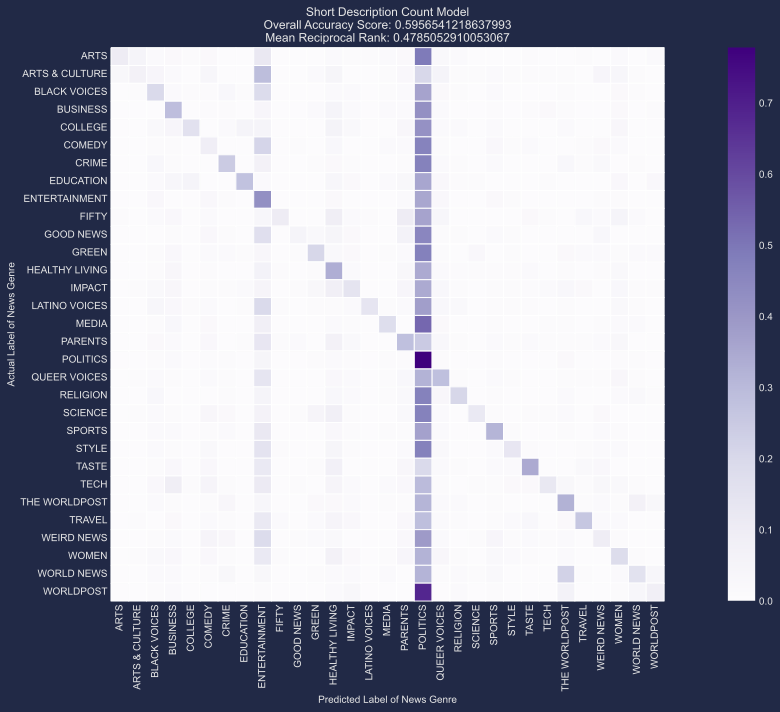

In [74]:
plt.figure(figsize=(18,10))

sns.heatmap(
  cm_td_only_normed_by_column, #normalized confusion matrix
  # annot=True, # add normalized counts of co-occurrences between actual vs. predicted
  fmt=".3f", # round to thousandths decimal place
  linewidths=1, # style choice for row/column lines
  square=True, # make the 
  cmap='Purples',
  xticklabels=model_td_only.classes_,
  yticklabels=model_td_only.classes_,
)

# Label the X and Y axes
plt.ylabel('Actual Label of News Genre')
plt.xlabel('Predicted Label of News Genre')

# Let's plug in our overall accuracy measures into the the title
all_sample_title = f"Short Description Count Model\nOverall Accuracy Score: {accuracy_td_only}\nMean Reciprocal Rank: {mrr_at_k_td_only}"
plt.title(
  all_sample_title,
  size=12
)

# Ok, output time!
plt.tight_layout()
mplcyberpunk.add_glow_effects()
plt.show()

#### 4.4.4 Explore and Assess Categories/Classes with True Positive Rates, False Positive Rates, etc.

Based on the above overall accuracy score and heatmap results per category, you can begin to identify news genre categories (or classes) that may be performing well versus categories that are not performing well. You can use the following code below to explore those performance biases per news genre in the corpus/model.

As you work through the code below, take notes as you compare the overall accuracy score of the model with specific optimal threshold scores, and be sure to compare those results against the EDA work that you conducted earlier in the notebook. 

Our LR model has 31 classes (news genres), so it's a "multi-class" LR model. To help us explore the predictive accuracy across each class, we must first use scikit-learn's `LabelBinarizer()` to enable us to compute the True Positive Rates (TPR) and False Positive Rates (FPR) for each class/category.

The 3 variables assigned below will help us process the training and testing data to do so.

##### 4.4.4.1 - Create data set of binary predictions per row across all of our classes

In [49]:
from sklearn.preprocessing import LabelBinarizer

In [50]:
# scikit-learn's LB() will turn the prediction output on the test data into zeroes and ones, where 1 == the predicted class (news genre) and 0 == not predicted class
label_binarizer = LabelBinarizer().fit(Y_test)

# This variable transforms the predictions into the 0s and 1—commonly referred to as either the "one vs all" test or "one hot" test. I actually don't know the origin of the 'one hot' term. :-/
y_onehot_test = label_binarizer.transform(Y_test)

# (rows == X inputs, columns == Y possible predicted classes)
y_onehot_test.shape

(31248, 31)

It is always a good practice to print out your data in some manner, so you can better understand and be sure that it's what you want/need.

In [51]:
# Reviews the test data per row and returns a binary
print(
  'Number of Classes/News Genres:',len(y_onehot_test[0]),
  '\nFirst row in test set:',y_onehot_test[0],
  '\nPrediction (1):',Y_test[0]
)

Number of Classes/News Genres: 31 
First row in test set: [0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 
Prediction (1): HEALTHY LIVING


##### 4.4.4.2 - Use that data to visualize the TPs & FPs with an "ROC Curve" & "Area Under the Curve"

An *ROC curve* (Receiver Operating Characteristic curve) is a tool to identify the relationship between the accurate "hit rate" (TP) and accurate "false alarms" (FP). 

This curve plots the False Positive (x) and True Positive (y) rates at their different classification thresholds to help us visualize the performance of the model at different potential thresholds. In effect, this visual can help you isolate the performance of some classes over others in relationship with the original EDA work that you have conducted.

You can also use ROC curve plots to see how when you lower the classification threshold, the model will classify more items as positive and increase both False Positives and True Positives.

The goal is to identify the optimal Area Under the Curve (AUC). It aggregates all of the probable classification values as a normalized value between 0 and 1 for each new input in the data set. 
- 0 == The model is wrong 100% of the time
- 1 == The model is correct 100% of the time

Think of it like the spectrum between 0 and 1 below, where the random positive predictions are positioned to the right of the random negative predictions. So, if the AUC score is `0.714`, then the probability that `p` is positioned to the right of `n` is `71.4%`.

```
Ouput of the LR Model
n = Actual Negative Prediction
p = Actual Positive Prediction
____0
|n
|n
|n
|n
|n
|n
|n
|n
|n
|p
|n
|n
|p
|p
|n
|p
|p
|p
|p
|p
|p
————1
```

Ok, that is a lot of info. Let's see some different visual methods to help us understand ROC curves as a means to plot the relationship between FP rates and TP rates.

##### 4.4.4.3 - Functions to Generate FPR, TPR, ROC, and AUC Data & Visualizations

In [utils.py](./utils.py), under the "MODEL EVALUATION FUNCTIONS" section, please review the following functions to create evaluative tests and visuals.

##### 4.4.4.4 - Create the ROC Data Set

Now, let's compute the FP and TP rates with the first function: `roc_curve_per_category`

In [52]:
df_all_classes_roc_values = roc_curve_per_category(
  list_classes=model_td_only.classes_,
  label_binarizer=label_binarizer,
  y_proba=Y_probability_a_td_only,
  y_one_vs_all=y_onehot_test
)
df_all_classes_roc_values.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44025 entries, 0 to 44024
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Class        44025 non-null  object 
 1   FPR          44025 non-null  float64
 2   TPR          44025 non-null  float64
 3   FPR_Optimal  44025 non-null  float64
 4   TPR_Optimal  44025 non-null  float64
dtypes: float64(4), object(1)
memory usage: 1.7+ MB


Let's check out a category in the dataframe. You can change the value of the `Class` query, so you can explore what data are returned by the `roc_curve_per_category` function. You can see that the function has generated the FPR and TPR for each new headline in the testing data. I also created a repeating column that tracks the Optimal FPR and TPR to use in our upcoming ROC curve plot.

In [53]:
df_all_classes_roc_values.loc[df_all_classes_roc_values.Class == 'WOMEN']

,Class,FPR,TPR,FPR_Optimal,TPR_Optimal
40471,WOMEN,0.000000,0.000000,0.1926,0.57
40472,WOMEN,0.000033,0.000000,0.1926,0.57
40473,WOMEN,0.000066,0.000000,0.1926,0.57
40474,WOMEN,0.000066,0.001129,0.1926,0.57
40475,WOMEN,0.000066,0.006772,0.1926,0.57
...,...,...,...,...,...
42076,WOMEN,0.974870,0.997743,0.1926,0.57
42077,WOMEN,0.974870,0.998871,0.1926,0.57
42078,WOMEN,0.979744,0.998871,0.1926,0.57
42079,WOMEN,0.979744,1.000000,0.1926,0.57


Ok, let's create a separate dataframe that isolates the optimal TPR and FPR values per class/category/news genre, so we can visualize them in alternative ways.

In [54]:
df_all_classes_optimal_roc_values = df_all_classes_roc_values.drop_duplicates(subset=['Class']).reset_index()[['Class','FPR_Optimal','TPR_Optimal']]

df_all_classes_optimal_roc_values

,Class,FPR_Optimal,TPR_Optimal
0,ARTS,0.2146,0.7189
1,ARTS & CULTURE,0.1482,0.5896
2,BLACK VOICES,0.1828,0.5845
3,BUSINESS,0.3023,0.7343
4,COLLEGE,0.2820,0.7138
5,COMEDY,0.4350,0.8087
6,CRIME,0.2441,0.7425
7,EDUCATION,0.0555,0.5885
8,ENTERTAINMENT,0.3533,0.8073
9,FIFTY,0.3154,0.7531


##### 4.4.4.5 - Plotting the ROC Curve per Class

/Users/calindgr/Documents/NCSU/Conferences/2024-2025/032025-CCCC/cccc25-cpu-love/3.10.12/lib/python3.10/site-packages/matplotlib/text.py:1475: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(x))
/Users/calindgr/Documents/NCSU/Conferences/2024-2025/032025-CCCC/cccc25-cpu-love/3.10.12/lib/python3.10/site-packages/matplotlib/text.py:1477: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  y = float(self.convert_yunits(y))
/Users/calindgr/Documents/NCSU/Conferences/2024-2025/032025-CCCC/cccc25-cpu-love/3.10.12/lib/python3.10/site-packages/matplotlib/text.py:905: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  x = float(self.convert_xunits(self._x))
/Users/calindgr/Documents/NCS

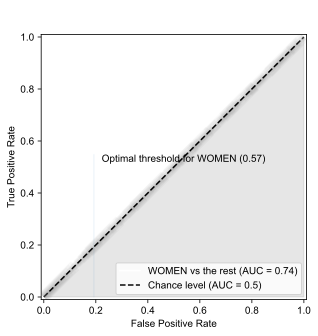

In [55]:
class_of_interest = "WOMEN"
plot_class_roc_curve(
  class_of_interest=class_of_interest,
  label_binarizer=label_binarizer,
  Y_one_vs_all=y_onehot_test,
  Y_prob_a=Y_probability_a_td_only,
  df_class_row=df_all_classes_optimal_roc_values.loc[df_all_classes_optimal_roc_values.Class == class_of_interest]
)

##### 4.4.4.6 - Alternative visualizations of the ROC Curve

There are other ways to plot this curve. Here are a few, which might help us understand the "Area Under the Curve" (AUC).

In [57]:
TPR_OPT_MEAN = df_all_classes_optimal_roc_values.drop_duplicates(subset=['Class'])['TPR_Optimal'].mean()
TPR_OPT_MEDIAN = df_all_classes_optimal_roc_values.drop_duplicates(subset=['Class'])['TPR_Optimal'].median()

FPR_OPT_MEAN = df_all_classes_optimal_roc_values.drop_duplicates(subset=['Class'])['FPR_Optimal'].median()
FPR_OPT_MEDIAN = df_all_classes_optimal_roc_values.drop_duplicates(subset=['Class'])['FPR_Optimal'].median()

print(
  'TPR/FPR - Estimates of Location',
  '\n----------------------------',
  '\nTPR_OPT_MEAN:',TPR_OPT_MEAN,
  '\nTPR_OPT_MEDIAN:',TPR_OPT_MEDIAN,
  '\n\nFPR_OPT_MEAN:',FPR_OPT_MEAN,
  '\nFPR_OPT_MEDIAN:',FPR_OPT_MEDIAN,
)

TPR/FPR - Estimates of Location 
---------------------------- 
TPR_OPT_MEAN: 0.7111612903225806 
TPR_OPT_MEDIAN: 0.7308 

FPR_OPT_MEAN: 0.2807 
FPR_OPT_MEDIAN: 0.2807


<Axes: title={'center': 'Optimal TP & FP Rates Per Class \n(TPR mean avg 0.7111612903225806, FPR mean avg 0.2807)'}, ylabel='Class'>

<Figure size 640x480 with 0 Axes>

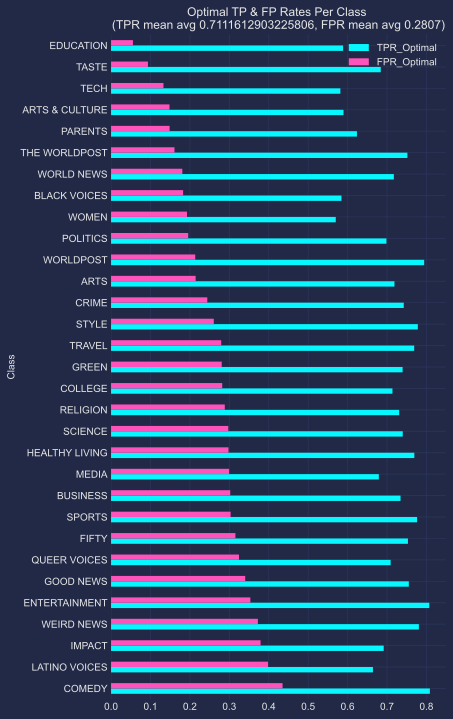

In [59]:
plt.figure()

df_all_classes_optimal_roc_values.sort_values(by='FPR_Optimal', ascending=False).plot(
  kind='barh',
  x='Class',
  y=['TPR_Optimal','FPR_Optimal'],
  figsize=(6,12),
  title='Optimal TP & FP Rates Per Class \n(TPR mean avg '+str(TPR_OPT_MEAN)+', FPR mean avg '+str(FPR_OPT_MEAN)+')'
)

You could use the above bar chart to compare class label performances in relationship to the mean/median optimal threshold rates.

#### 4.4.5 `text_desc` only & count-based modeling assessment

- **Accuracy**: 
- **MRR**:
- **Insert Observation #1**
  - Enter thoughts about this observation based on the available assessment evidence above
- **Insert Observation #2**
  - Enter thoughts about this observation based on the available assessment evidence above
- ...

### 4.5 Model 2 - `tfidf` features with `text_desc_headline` - short description + headline

In [60]:
field='text_desc_headline'
feature_rep='tfidf'
top_k=3

model_tfidf_tdh,transformer_tfidf_tdh,accuracy_tfidf_tdh,mrr_at_k_tfidf_tdh,X_tfidf_tdh_train,X_tfidf_tdh_test,Y_tfidf_tdh_test,Y_tfidf_tdh_train,preds_tfidf_tdh,eval_items_tfidf_tdh = train_model(
  df,
  field=field,
  feature_rep=feature_rep,
  top_k=top_k
)

print(f"\n\nSimple Mean Average Model Accuracy = {accuracy_tfidf_tdh}\nMean Reciprocal Rank = {mrr_at_k_tfidf_tdh}\n")

2025-04-08 12:56:54,949 : INFO : Starting model training...
2025-04-08 12:56:55,051 : INFO : Extracting features and creating vocabulary...
2025-04-08 12:56:57,049 : INFO : Training a Logistic Regression Model. This may take a few minutes. ...
2025-04-08 12:57:42,081 : INFO : Starting evaluation...
2025-04-08 12:57:42,132 : INFO : Done training and evaluation.




Simple Mean Average Model Accuracy = 0.8359254992319508
Mean Reciprocal Rank = 0.7172085680150102



#### 4.5.1 `text_desc`, `headline`, & TF-IDF-based modeling assessment

Now, use the same assessment techniques as in the `text_desc` only model to assess this model that uses TF-IDF + a combination of the short description and headline values as features for the model.

Write your observations and evidence below.

- **Accuracy**: 
- **MRR**:
- **Insert Observation #1**
  - Enter thoughts about this observation based on the available assessment evidence above
- **Insert Observation #2**
  - Enter thoughts about this observation based on the available assessment evidence above
- ...

### 4.6 Model 3 - `tfidf` features with `text_desc_headline_url`: description, headline, *and* url

In [61]:
field='text_desc_headline_url'
feature_rep='tfidf'
top_k=3

model_tfidf_all,transformer_tfidf_all,accuracy_tfidf_all,mrr_at_k_tfidf_all,X_tfidf_all_train,X_tfidf_all_test,Y_tfidf_all_test,Y_tfidf_all_train,preds_tfidf_all,eval_items_tfidf_all = train_model(
  df,
  field=field,
  feature_rep=feature_rep,
  top_k=top_k
)

print("\nAccuracy={0}; MRR={1}".format(accuracy_tfidf_all,mrr_at_k_tfidf_all))

2025-04-08 12:57:42,148 : INFO : Starting model training...
2025-04-08 12:57:42,173 : INFO : Extracting features and creating vocabulary...
2025-04-08 12:57:44,837 : INFO : Training a Logistic Regression Model. This may take a few minutes. ...
2025-04-08 12:58:37,649 : INFO : Starting evaluation...
2025-04-08 12:58:37,671 : INFO : Done training and evaluation.



Accuracy=0.8672875064004096; MRR=0.7511734084314612


#### 4.6.1 `text_desc`, `headline`, `URL`, & TF-IDF-based modeling assessment

Now, use the same assessment techniques as the previous models to assess this third model that uses TF-IDF + a combination of the short description, headline, and URL values as features for the model.

Write your observations and evidence below.

- **Accuracy**: 
- **MRR**:
- **Insert Observation #1**
  - Enter thoughts about this observation based on the available assessment evidence above
- **Insert Observation #2**
  - Enter thoughts about this observation based on the available assessment evidence above
- ...

## 5. Check Predictions on Unseen Articles

Try from articles that aren't from HuffPost: CNN, Fox, MSNBC, etc.

Remember that the algorithm will return the top `k` probabilities. I've created a default of 3 for `k`. The first value in the list is the top returned predicted value.

### 5.1 Model 1 trained by counts method &amp; the features from the short description only

This uses Model 1: 

- Model: `model_td_only`
- Transformer: `transformer_td_only`

In [62]:
# https://www.cnn.com/2019/07/19/health/astronaut-exercise-iv-faint-scn/index.html
test_features = transformer_td_only.transform(
  ["Exercise in space keeps astronauts from fainting when they return to Earth, study says."]
)
get_top_k_predictions(
  model_td_only, 
  test_features,
  3
)

[['SCIENCE', 'WOMEN', 'GREEN']]

### 5.2 Model 2 trained by TF-IDF &amp; the features from the short description &amp; headline

This uses Model 2:

- Model: `model_tfidf_tdh`
- Transformer: `transformer_tfidf_tdh`

In [63]:
# URL: https://www.network.com/enter/url/to/story/here.html

test_features=transformer_tfidf_tdh.transform(
  ["Exercise in space keeps astronauts from fainting when they return to Earth, study says."]
)

get_top_k_predictions(
  model_tfidf_tdh,
  test_features,
  3
)

[['SCIENCE', 'WEIRD NEWS', 'HEALTHY LIVING']]

### 5.3 Model 3 trained by TF-IDF &amp; the features from the short description, headline &amp; URL

This uses Model 3:

- Model: `model_tfidf_all`
- Transformer: `transformer_tfidf_all`

In [64]:
# URL: https://www.network.com/enter/url/to/story/here.html
test_features=transformer_tfidf_tdh.transform(
  ["Exercise in space keeps astronauts from fainting when they return to Earth, study says."]
)

get_top_k_predictions(
  model_tfidf_tdh,
  test_features,
  3
)

[['SCIENCE', 'WEIRD NEWS', 'HEALTHY LIVING']]

## 6. Save Models for Future Use


In [65]:
import pickle

In [67]:
def pickle_dump(model, model_path_filename, transformer, transformer_path_filename):
  '''
    # pickle_dump()

    **Purpose**: Save a trained model and transformer.

    ## @params
    - `model`: Trained model to save as `.pkl` file.
    - `model_path_filename`: String. Model's full path and filename with `.pkl` file format.
    - `transformer`: Vectorizer transformer object.  
    - `transformer_path_filename`: String. Transformer's full path and filename with `.pkl` file format.

    ## @returns
    - None. It prints out a message where it saved to verify.
  '''
  # Save both model & transformer to encode a document and the model itself to make predictions based on the weight vectors 
  pickle.dump( model, open(model_path_filename, 'wb') )
  pickle.dump( transformer, open(transformer_path_filename,'wb') )
  print(f"Model saved to {model_path_filename}")
  print(f"Transformer saved to {transformer_path_filename}")

In [69]:
# Use imported `pickle` code library to save trained models & transformers—see pickle_dump() utility function.

#### 1. COUNTS - 'text_desc' as features only ####
pickle_dump(
  model=model_td_only,
  model_path_filename="./models/news_genre_model_binary_text_desc_only.pkl",
  transformer=transformer_td_only,
  transformer_path_filename="./models/news_genre_transformer_binary_text_desc_only.pkl"
)

#### 2. TF-IDF - 'text_desc_headline' as features ####
pickle_dump(
  model=model_td_only,
  model_path_filename="./models/news_genre_model_tfidf_tdh.pkl",
  transformer=transformer_td_only,
  transformer_path_filename="./models/news_genre_transformer_tfidf_tdh.pkl"
)

#### 3. TF-IDF - 'text_desc_headline_url' as features ####
pickle_dump(
  model=model_td_only,
  model_path_filename="./models/news_genre_model_tfidf_all.pkl",
  transformer=transformer_td_only,
  transformer_path_filename="./models/news_genre_transformer_tfidf_all.pkl"
)


Model saved to ./models/news_genre_model_binary_text_desc_only.pkl
Transformer saved to ./models/news_genre_transformer_binary_text_desc_only.pkl
Model saved to ./models/news_genre_model_tfidf_tdh.pkl
Transformer saved to ./models/news_genre_transformer_tfidf_tdh.pkl
Model saved to ./models/news_genre_model_tfidf_all.pkl
Transformer saved to ./models/news_genre_transformer_tfidf_all.pkl


## 7. Use Loaded Model

With pickle, we can now also load the model and use it without needing to retrain everything. A good time saver to consider for your team's final project!

In [70]:
# Load Model 2 for reference
# Note my variable assignments include "loaded_" so I can distinguish variable assignments, if necessary.
model_path_tdh = "./models/news_genre_model_tfidf_tdh.pkl"
transformer_path_tdh = "./models/news_genre_transformer_tfidf_tdh.pkl"

loaded_model_tfidf_tdh = pickle.load(open(model_path_tdh, 'rb'))
loaded_transformer_tfidf_tdh = pickle.load(open(transformer_path_tdh, 'rb'))


In [71]:
# URL: https://www.usatoday.com/story/travel/airline-news/2025/04/07/avelo-airlines-ice-deportation-flights/82980364007/
loaded_test_features_tfidf_tdh = loaded_transformer_tfidf_tdh.transform(
  ["Ultra low cost carrier Avelo Airlines will operate deportation flights under ICE charter"]
)

get_top_k_predictions(
  loaded_model_tfidf_tdh,
  loaded_test_features_tfidf_tdh,
  3
)

[['TRAVEL', 'POLITICS', 'WORLDPOST']]

## Conclusion

Overall, do your best to have understood this LR modeling/training process: the goals for the model in relationship to the original data set used. By documenting your observations and using Python to conduct EDA + model assessments, you can complete the following work that you will need to repeat for your final project:

1. Identify potential boundaries, biases, and limits of the data in relationship to your developing and changing goals for modeling
2. Conversely, identify potential possibilities and affordances of the data in relationship to your developing and changing goals for modeling
3. Documenting these biases, affrodances, and changes in goals
4. Use this notebook material to develop a Model Card that communicates the aforementioned material in a more concise and helpful manner.

Note that there is a next step that folks would take next, based on their analysis to "tune" their model. We won't get to that part of the process in this class. Instead, we are focusing on the initial training step, the impact of different features available to use in the data set, and assessing the initial training based on the data.